# Librareis
import libraries

In [107]:
import seaborn as sns 
import matplotlib.pyplot as plt 
import numpy as np 
from PIL import Image
from wordcloud import WordCloud, STOPWORDS
import pandas as pd 



import data 

In [108]:
data=[]
for year in range(2010,2020):
    m=pd.read_csv('C:\\Users\\alise\\Dropbox\\Programming\\Machine learning in physics- 2021\\Project\\Success in movies\\Machine-learning-in-physics-Project\\Phase 1-Data Collection\\Data\\Yearly data sets\\%s.csv'%year,index_col=0)
    data.append(m)
meta=pd.concat(data,ignore_index=True)
meta.drop_duplicates(subset=['Mojo ID'],inplace=True)

In [109]:
meta.columns

Index(['IMDB ID', 'Mojo ID', 'title', 'Genres', 'Year', 'Domestic Gross ($)',
       'Worldwide Gross ($)', 'Opening ($)', 'Budget', 'Opening Theaters',
       'Release Date', 'MPAA', 'In Realease (Days)', 'Widest Release', 'Stars',
       'Director(s)', 'Writer(s)', 'Producer(s)', 'Running time (min)',
       'IMDB score', 'IMDB votes', 'Metascore', 'Meta Users', 'Country',
       'Language', 'Distributor', 'Plot Outline'],
      dtype='object')

In [110]:
meta.head(5)

,IMDB ID,Mojo ID,title,Genres,Year,Domestic Gross ($),Worldwide Gross ($),Opening ($),Budget,Opening Theaters,...,Producer(s),Running time (min),IMDB score,IMDB votes,Metascore,Meta Users,Country,Language,Distributor,Plot Outline
0,tt0499549,876971521,Avatar,Action\n \n Adventure\n \n ...,2011.0,749766139.0,2.744337e+09,77025481.0,237000000.0,3452.0,...,Brooke Breton\n James Cameron\n Laeta Kalogrid...,162.0,7.8,1122762.0,83.0,"3,483 user\n536 critic\n",USA,English,Twentieth Century Fox,A paraplegic Marine dispatched to the moon Pan...
1,tt0435761,1383564801,Toy Story 3,Adventure\n \n Animation\n \n ...,2011.0,415004880.0,1.066970e+09,110307189.0,200000000.0,4028.0,...,Darla K. Anderson\n John Lasseter\n Nicole Par...,103.0,8.2,760723.0,92.0,912 user\n479 critic\n,USA,English,Walt Disney Studios Motion Pictures,The toys are mistakenly delivered to a day-car...
2,tt1014759,3393226241,Alice in Wonderland,Adventure\n \n Family\n \n ...,2011.0,334191110.0,1.025467e+09,116101023.0,200000000.0,3728.0,...,Katterli Frauenfelder\n Derek Frey\n Chris Leb...,108.0,6.4,385498.0,53.0,802 user\n459 critic\n,USA\nUK,English,Walt Disney Studios Motion Pictures,Nineteen-year-old Alice returns to the magical...
3,tt1228705,1515881985,Iron Man 2,Action\n \n Adventure\n \n ...,2011.0,312433331.0,6.239333e+08,128122480.0,200000000.0,4380.0,...,Victoria Alonso\n Louis D'Esposito\n Susan Dow...,124.0,7.0,726620.0,57.0,912 user\n498 critic\n,USA,English,Paramount Pictures,With the world now aware of his identity as Ir...
4,tt1325004,659654145,The Twilight Saga: Eclipse,Action\n \n Adventure\n \n ...,2011.0,300531751.0,6.984913e+08,64832191.0,68000000.0,4468.0,...,Bill Bannerman\n Marty Bowen\n Wyck Godfrey\n ...,124.0,5.0,229133.0,58.0,528 user\n294 critic\n,USA,English,Summit Entertainment,As a string of mysterious killings grips Seatt...


In [111]:
Now lets look at the correlations between different features 

SyntaxError: invalid syntax (<ipython-input-111-c7a80d950052>, line 1)

In [ ]:
feature1=['Domestic Gross ($)','Worldwide Gross ($)','Opening ($)','Budget','Opening Theaters','In Realease (Days)','Running time (min)','IMDB score','IMDB votes','Metascore']
meta[feature1]

In [ ]:
fig=plt.figure(figsize=(10,8))
sns.heatmap(meta[feature1].corr(), cmap='YlGnBu', annot=True, linewidths = 0.2)

Now let's look at the distribution of the worldwide Gross

In [ ]:
fig=plt.figure(figsize=(5,5))
sns.histplot(meta['Worldwide Gross ($)'])
plt.show()

As you can see the the resaults are not very clear because of high number of low sales movies. For better visualization let's look at the logarithmic plot

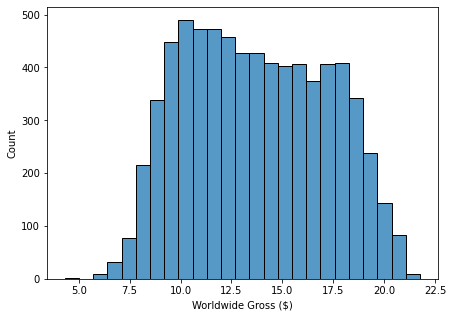

In [115]:
log_gross=np.log1p(meta['Worldwide Gross ($)'])
fig=plt.figure(figsize=(7,5))
sns.histplot(log_gross,bins=25)
plt.show()

Budget vs worldwide gross 

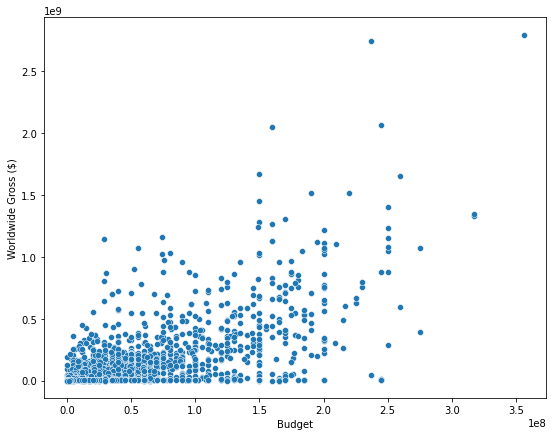

In [116]:
fig=plt.figure(figsize=(9,7))
sns.scatterplot(x=meta['Budget'],y=meta['Worldwide Gross ($)'])
plt.show()

In [117]:
sample =  meta.sample(1000)[feature1]
sample['Domestic Gross ($)']=np.log1p(sample['Domestic Gross ($)'])

In [118]:
sample['Worldwide Gross ($)']=np.log1p(sample['Worldwide Gross ($)'])
sample['Opening ($)']=np.log1p(sample['Opening ($)'])
sample['Budget']=np.log1p(sample['Budget'])

In [119]:
sample=sample.rename(columns={'Domestic Gross ($)':'log(Domestic Gross ($))','Worldwide Gross ($)':'log(Worldwide Gross ($))','Opening ($)':'log(Opening ($))','Budget':'log(Budget)'})

In [120]:
sample

,log(Domestic Gross ($)),log(Worldwide Gross ($)),log(Opening ($)),log(Budget),Opening Theaters,In Realease (Days),Running time (min),IMDB score,IMDB votes,Metascore
7322,8.420242,11.529694,8.026824,NaN,10.0,340.0,110.0,5.0,4694.0,54.0
2418,14.089797,14.222039,10.984665,17.875954,4.0,215.0,95.0,7.1,77968.0,61.0
3769,8.316789,17.977470,8.316789,NaN,10.0,118.0,85.0,6.3,6222.0,47.0
7862,12.120531,12.120531,10.959627,NaN,57.0,243.0,97.0,6.2,266.0,89.0
786,16.443346,17.899627,15.440737,16.523561,1719.0,135.0,107.0,7.0,139936.0,48.0
...,...,...,...,...,...,...,...,...,...,...
937,13.046650,15.511557,12.405677,NaN,92.0,268.0,137.0,4.6,5305.0,NaN
3234,14.134524,15.442908,11.302291,15.607270,4.0,251.0,85.0,7.1,136921.0,81.0
5124,11.701444,11.701444,9.523983,NaN,4.0,254.0,112.0,6.7,299.0,65.0
3079,17.739016,18.724510,16.553248,17.909855,3387.0,349.0,105.0,6.2,123477.0,57.0


C:\Users\alise\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:331: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():


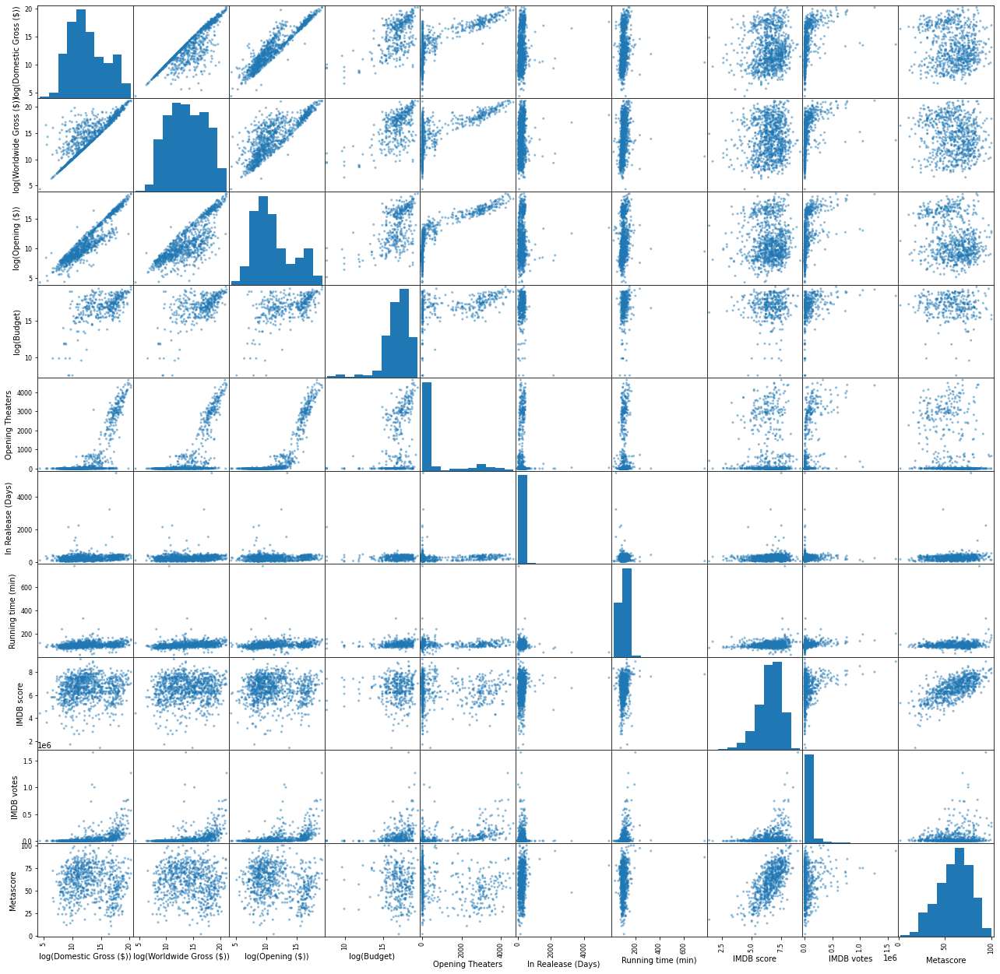

In [121]:
pd.plotting.scatter_matrix(sample, figsize=(22,22))
#plt.savefig('matrix.pdf',bbox_inches='tight')
plt.show()


In [122]:
meta.shape

(7096, 27)

In [123]:
grouped=meta.groupby('Language')
users_sorted_average =pd.DataFrame({col:vals['Worldwide Gross ($)'] for col,vals in grouped}).mean().sort_values(ascending=False)
users_sorted_average

American Sign Language    1.244870e+08
Chinese                   8.731926e+07
Mandarin                  7.666183e+07
Indonesian                7.228708e+07
English                   5.541304e+07
                              ...     
Zulu                      1.171000e+04
Burmese                   8.077000e+03
Dari                      7.919000e+03
Rhaetian                  6.719000e+03
Ukrainian                 3.909000e+03
Length: 84, dtype: float64

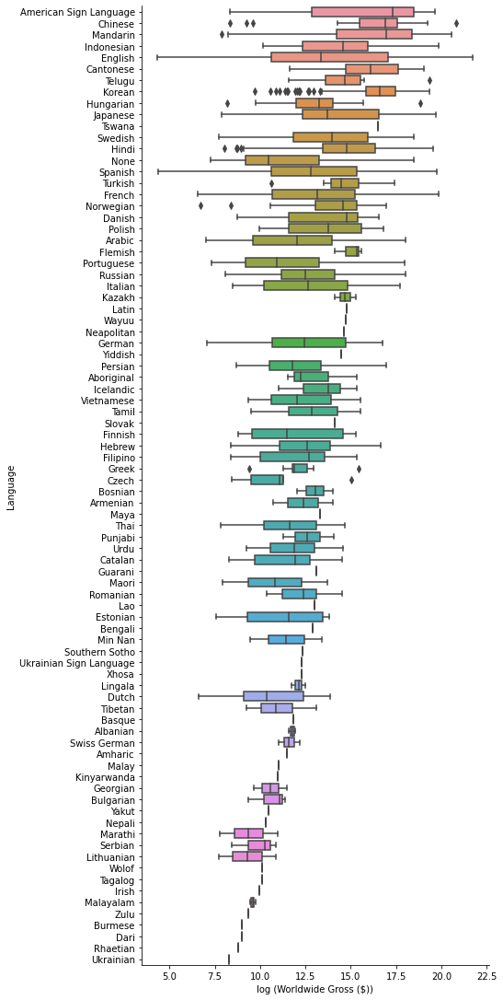

In [124]:
sns.catplot(x=np.log1p(meta['Worldwide Gross ($)']), y=meta.Language,data=meta,kind='box',order=users_sorted_average.index,height=15,aspect=1/2)
plt.xlabel('log (Worldwide Gross ($))')
plt.savefig('box.pdf',bbox_inches='tight')

# Movies' titles world cloud 

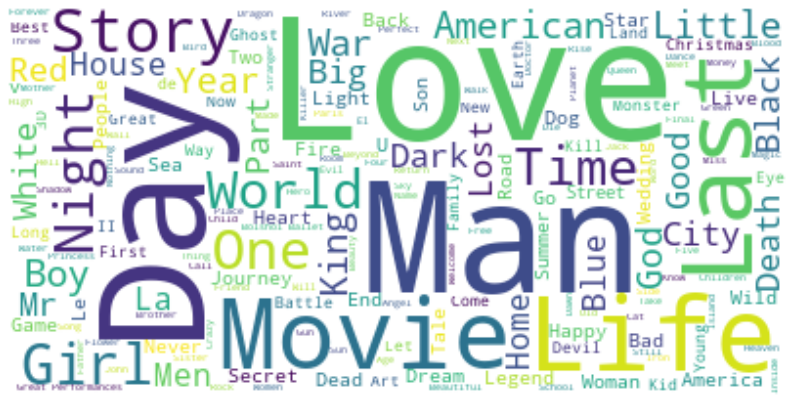

In [95]:
from wordcloud import WordCloud, STOPWORDS
a=''
for item in meta.title.values:
    if type(item)==str:
        a=a+' '+item
a=a.strip()
stopwords = set(STOPWORDS)
movie_wc = WordCloud(
    background_color='white',
    max_words=2000,
    stopwords=stopwords,
    
)

# generate the word cloud
movie_wc.generate(a)
# display the word cloud
fig = plt.figure()
fig.set_figwidth(14) # set width
fig.set_figheight(14) # set height

plt.imshow(movie_wc, interpolation='bilinear')
plt.axis('off')
plt.savefig('cload.pdf',bbox_inches='tight')
plt.show()

# Month Plot 

In [125]:
for index in meta.index:
    if type(meta.loc[index,'Release Date'])!=float:
        try:
            meta.loc[index,'Day']=int(meta.loc[index,'Release Date'].split()[1].replace(',',''))
            meta.loc[index,'Month']=meta.loc[index,'Release Date'].split()[0]
        except:
            meta.loc[index,'Day']=int(meta.loc[index,'Release Date'].split('-')[0])
            meta.loc[index,'Month']=meta.loc[index,'Release Date'].split('-')[1]

In [136]:
 order=meta.groupby('Month')['Worldwide Gross ($)'].mean().sort_values(ascending=False).index.values

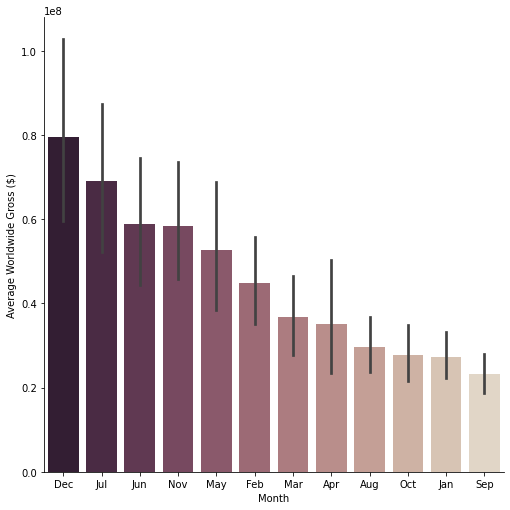

In [137]:
sns.catplot(x='Month',y='Worldwide Gross ($)',kind='bar',palette="ch:.25_r",data=meta,height=7,order=order)
plt.ylabel('Average Worldwide Gross ($)')
plt.savefig('C:\\Users\\alise\\Dropbox\\Programming\\Machine learning in physics- 2021\\Project\\Success in movies\\Machine-learning-in-physics-Project\\Phase 1-Data Collection\\figs\\gross-month.pdf',bbox_inches='tight')

In [138]:
order=meta.groupby('Month')['Worldwide Gross ($)'].count().sort_values(ascending=False).index.values

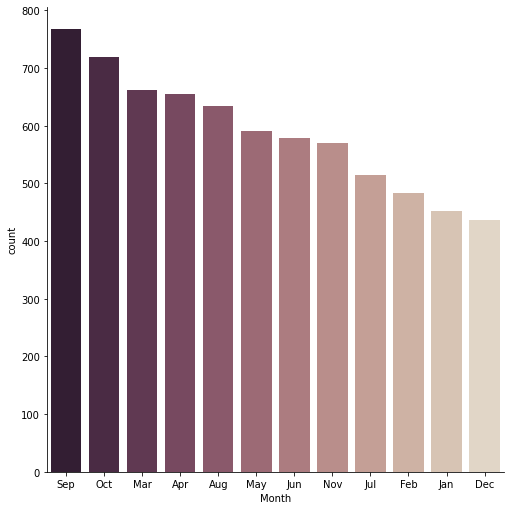

In [139]:
sns.catplot(x='Month',data=meta,kind='count',palette="ch:.25_r",height=7,order=order)
plt.savefig('month hist.pdf',bbox_inches='tight')

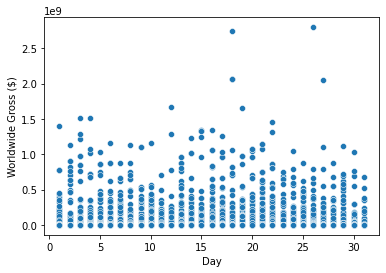

In [543]:
sns.scatterplot(x=meta['Day'],y=meta['Worldwide Gross ($)'],palette="ch:.25")